# Chapter 12 Custom Models and Training with TensorFlow

## A Quick Tour of TensorFlow

##### What does TensorFlow offer
* **Its core is very similar to NumPy, but with GPU support**
* **It supports distributed computing(across multiple devices and servers)**
* **It includes a kind of just-in-time(JIT) compiler that allows it to optimize the computations for speed and memory usage.**
    * **It works by extracting the *computatopm graph* from a Python function, then optimizing it(e.g, by pruning unused nodes), and finally running it efficiently(e.g., by automatically running independent operations in parallel).**
    * **It implements autodiff and provides some excellent optimizers, such as RMSProp and Nadam, so you can easily minimize all sorts of loss functions.**

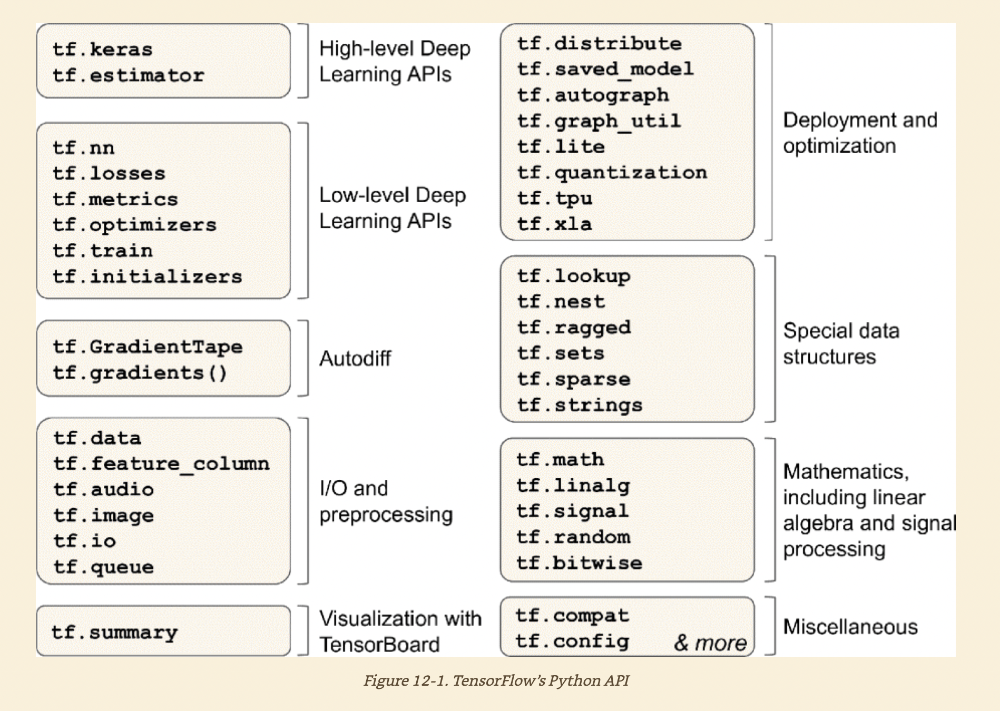

* **Many operations have multiple implementation called *kernels*: each kernel is dedicated to a specific device type, such as CPUs, GPUs, or even TPUs(tensor processing units).**

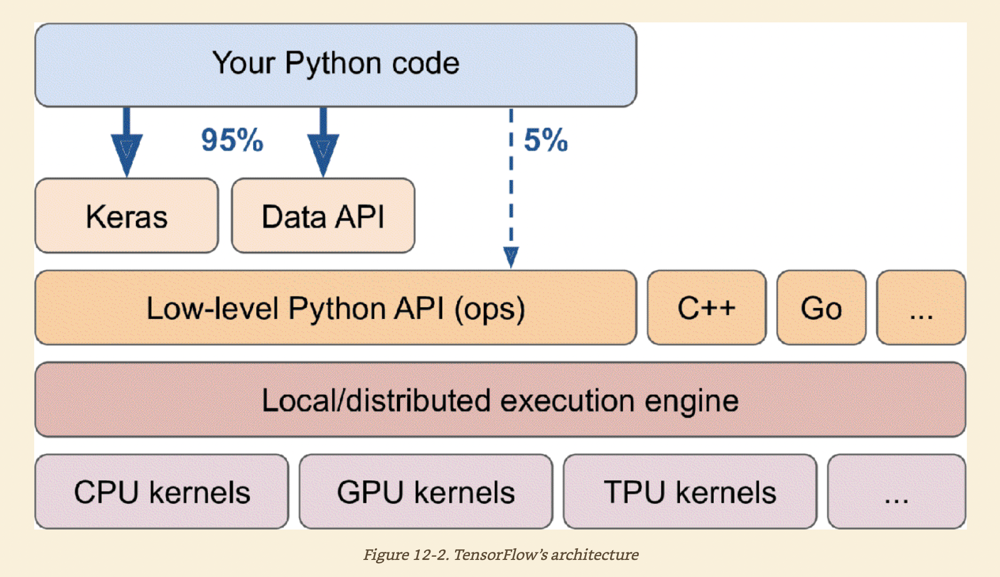

##### TensorFlow Architecture
* **Most of the tume your code will use the high-level APIs(especially tf.keras and tf.data); but when you need more flexibility, you will use the lower-level Python API, handling tensors directly.**

## Using TensorFlow Like Numpy
* **TensorFlow's API revolves around tensors,which flow from operation to operation -- hence the name TensorFlow.**
* **A tensor is very similar to a NumPy** ndarray: **it is usually a multidimensional array, but it can also hold a scalar**

### Tensors and operations
* **You can create a tensor with** tf.consant( ) 

In [2]:
import tensorflow as tf

**Creating a tensor representing a matrix with two rows and three columns**

In [3]:
tf.constant([[1., 2., 3.], [4., 5., 6.]]) # matrix

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

In [4]:
tf.constant(42)

<tf.Tensor: shape=(), dtype=int32, numpy=42>

**Just like an** ndarray, **a** tf.Tensor **has a shape and a data type(dtype).**

In [5]:
t = tf.constant([[1., 2., 3.], [4., 5., 6.]])

In [6]:
t.shape

TensorShape([2, 3])

In [7]:
t.dtype

tf.float32

* **Indexing works much like NumPy**

In [8]:
t[:, 1:]

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[2., 3.],
       [5., 6.]], dtype=float32)>

In [9]:
t[..., 1, tf.newaxis]

<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
array([[2.],
       [5.]], dtype=float32)>

* **Most importantly, all sorts of tensor operations are avaliable.**

In [10]:
t + 10

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[11., 12., 13.],
       [14., 15., 16.]], dtype=float32)>

In [11]:
tf.square(t)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)>

In [12]:
t @ tf.transpose(t)

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[14., 32.],
       [32., 77.]], dtype=float32)>

* **You will find all the basic operations you need(** tf.add( ), tf.multiply( ), tf.square( ), tf.exp( ), tf.sqrt( ), etc **),and most operations that you can find in NumPy(e.g.,** tf.reshape( ), tf.squeeze( ), tf.tile( )).
* **Some functions have a different name than in NumPy,** tf.reduce_mean( ), tf.reduce_sum( ), tf.reduce_max( ), **and** tf.math.log( ) **are the equivalent of** np.mean( ), np.sum( ), np.max( ), **and** np.log( ).

### Tensors and NumPy
* **You can create a tensor from a NumPy array, and vice versa.**
* **You can also apply TensorFlow operations to NumPy arrays and NumPy operations to tensors.**

In [14]:
import numpy as np

In [15]:
a = np.array([2., 4., 5.])
tf.constant(a)

array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)

In [16]:
t.numpy() # or np.array(t)

array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)

In [17]:
tf.square(a)

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([ 4., 16., 25.])>

In [18]:
np.square(t)

array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)

* **NumPy uses 64-bit precision by default, while TensorFlow uses 32-bit. This is because 32-bit precision is generally more than enough for neural networks, plus it runs faster and uses less RAM.**

### Type Conversions
* **TensorFlow does not perform type conversions automatically: it just raises an exception if you try to execute an operation on tensors with incompatile types**

**Use** tf.cast( ) **when you really need to convert types**

In [20]:
t2 = tf.constant(40., dtype=tf.float64)
tf.constant(2.0) + tf.cast(t2, tf.float32)

<tf.Tensor: shape=(), dtype=float32, numpy=42.0>

### Variables
* tf.Tensor **values are immutable. This means that we cannot use regular tensors to implement weights in a neural network, since they need to be tweaked by backpropagation.** 
* **What we need is a** tf.Variable

In [25]:
v = tf.Variable([[1., 2., 3.], [4., 5., 6.]])

In [26]:
v

<tf.Variable 'Variable:0' shape=(2, 3) dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

* **A** tf.Variable **acts much like a** tf.Tensor, **but it can also be modified in place using the** assign( ) **method(or** assign_add( ) **or** assign_sub( ), **which increment or decrement the variable by the given value).**
* **You can modify individual cells(or slices),by using the cell's(or slice's)** assign( ) **method(direct item assignment will not work) or by using the** scatter_update( ) **or** scatter_nd_update( ) **methods:**

In [27]:
v.assign(2 * v) 

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2.,  4.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [28]:
v[0, 1].assign(42)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [29]:
v[:, 2].assign([0., 1.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  0.],
       [ 8., 10.,  1.]], dtype=float32)>

In [30]:
v.scatter_nd_update(indices=[[0, 0], [1, 2]], updates=[100., 200.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[100.,  42.,   0.],
       [  8.,  10., 200.]], dtype=float32)>

* **In practice you wil rarely have to create variables manually, since Keras provides an** add_weight( ) **method that will take care of it for you.**

### Other Data Structures

##### Sparse tensors
* **Efficiently represent tensors containing mostly zeros. The** tf.sparse **pacakge contains operations for sparse tensors.**

##### Tensor arrays(tf.TensorArray)
* **Lists of tensors. They have a fixed size by default but can optionally be made dynamic(i.e., mutable).**
* **All tensors they contain must have the same shape and data type.**

##### Ragged tensors(tf.RaggedTensor)
* **Represent lists of lists of tensors, where every tensor has the same shape and data type.**
* **The** tf.ragged **package contains operations for ragged tensors.**

##### String tensors
* **Are regular tensors of type** tf.string. **

##### Sets 
* **Are represented as regular tensors(or sparse tensors). More generally, each set is represented by a vector in the tensor's last axis. You can manipulate sets using operations from the** tf.sets **pacakage**

##### Queues
* **Store tensors across multiple steps. TensorFlow offers various kinds of queues: simple First In, First Out(FIFO) queues(FIFOQueue), queues that can prioritize some items(PriorityQueue), shuffle their items(RandomShuffleQueue), and batch items of different shapes by padding(PaddingFIFOQueue).**

## Customizing Models and Training Algorithms

### Custom Loss Functions
* **Huber Loss Function**
* **The Huber Loss function is availiable in tf.keras.losses.Huber** 

**Creating a custom Huber Loss Function**
* **Createa fucntion that takes labels and predictions as arguments, and use TensorFlow operations to compute every instance's loss**

In [ ]:
def huber_fn(y_true, y_pred):
    error = y_true - y_pred
    is_small_error = tf.abs(error) < 1
    squared_loss = tf.square(error) / 2
    linear_loss = tf.abs(error) - 0.5
    return tf.where(is_small_error, squared_loss, linear_loss)

* **It is preferable to return a tensor containing one loss per instance, rather than returning the mean loss. This way, Keras can apply class weights or sample weights when requested.**

In [ ]:
model.compile(loss=huber_fn, optimizer="nadam")
model.fit(X_train, y_train, [...])

* **For each batch during training, Keras will call the** hubber\_fn( ) **function to compute the loss and use it to perform a Gradient Descent step.**
* **It will keep track of the total loss since the beginning of the epoch, and it will display the mean loss.**

### Saving and Loading Models That Contain Custom Components
* **Saving a model containing a custom loss function works fine, as Keras saves the name of the function.**
* **Whenever you load it, you'll need to provide a dictionary that maps the function name to the actual function.**

**When you load a model containing custom objecs, you need to map the names to the objects.**

In [ ]:
model = keras.models.load_model("my_model_with_a_custom_loss.h5",
                               custom_objects={"huber_fn":huber_fn})

* **What if you want a different threshold for the Huber loss function?**
* **One solution is to create a configured loss function**

In [31]:
def create_huber(threshold=1.0):
    def huber_fn(y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < threshold
        squared_loss = tf.square(error) / 2
        linear_loss = threshold * tf.abs(error) - theshold**2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)
    return huber_fn

In [ ]:
model.compile(loss=create_huber(2.0), optimizer="nadam")

* **When you save the model, the** threshold **will not be saved.**
    * **This means that you will have to specify the** threshold **value when loading the model.**

In [ ]:
model = keras.models.load_model("my_model_with_a_custom_loss_threshold_2.h5",
                               custom_objects={"huber_fn":create_huber(2.0)})

* **You can solve this by creating a subclass of the** keras.losses.Loss **class, and then implementing its** get_config( ) **method.**

In [34]:
class HuberLoss(keras.losses.Loss):
    def __init__(self, threshold=1.0, **kwargs):
        self.thresold = threshold
        super().__init__(**kwargs)
        
    def call(self, y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < self.threshold
        squared_loss = tf.square(error) / 2
        linear_loss = self.threshold * tf.abs(error) - self.thresold**2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)
    
    def get_config(self):
        base_config = super().get_config()
        return{**base_config, "threshold": self.threshold}

* **The constructor accepts** \*\*kwargs **and passes them to the parent constrcutor, which handles standard hyperparameters: the name of the** loss **and the** reduction **algorithm to use to aggregate the individual instance losses**
    * **By default, the reduction algorithm is** "sum_ober_batch_size", **which means that the loss will be the sum of the instance losses, weighted by the sample weights, if any, and divide by the batch size(not by the sum of weights, so this is *not* the weighted mean).**
* **The** call( ) **method takes the bales and predictions, computes all the instance losses, and returns them**
* **The** get_config( ) **method returns a dictionary mapping each hyperparameter name to its value.**
    * **It first calls the paren class'** get_config( ) **method, then adds the hyperparameters to this dictionary**

**You can use any instance of this class when you compile the model**

In [ ]:
model.compile(loss=HuberLoss(2.), optimizer="nadam")

* **When you save the model, the threshold will be saved along with itl and when you load the model, you just need to map the class name to the class itself.**

In [ ]:
model = keras.models.load_model("my_model_with_a_custom_loss_class.h5",
                               custom_objects={"HuberLoss":HuberLoss})

* **When you save the model, keras calls the loss instance's** get_config( ) **method and save the config as JSON in the HDF5 file.**
* **When you load the model, it calls the** from_config( ) **class method on the** HuberLoss **class: this method is implemented by the base class(** Loss **) and creates an instacne of the class, passing** \*\*config **to the constructor.**

### Custom Activation Functions, Initializers, Regularizers, and Constraints

**Custom function of** keras.activations.softplus( )

In [65]:
def my_softplus(z): # return value is just tf.nn.softplus(z)
    return tf.math.log(tf.exp(z) + 1.0)

**Custom function of *glorot initializer*.**

In [35]:
def my_glorot_initializer(shape, dtype=tf.float32):
    stddev = tf.sqrt(2. / (shape[0] + shape[1]))
    return tf.random.normal(shape, stddev=stddev, dtype=dtype)

**Custom $\mathcal{l}_1 $ regularizer(equivalent to** keras.regularizers.l1(0.01) **)**

In [36]:
def my_l1_regularizer(weights):
    return tf.reduce_sum(tf.abs(0.01 * weights))

**A custom constraint that ensures all weights are positive**

In [ ]:
def my_positive_weights(weights): # return value is just tf.nn.relu(weights)
    return tf.where(weights<0., tf.zeros_like(weights), weights)

* **These custom function can be then used normally**

In [ ]:
layer = keras.layers.Dense(30, activation=my_sotfplus, 
                          kernel_initializer=my_glorot_initializer,
                          kernel_regularizer=my_l1_regularizer,
                          kernel_constraint=my_positive_weights)

* **The activation function will be applied to the output of the** Dense **layer, and its result will be passed on to the next layer.**
* **The layer's weights will be initialized using the value returned by the intializer.**
* **Art each training step the weights will be passed to the regularization function to compute the regularization loss, which will be added to the main loss to get the final loss used for training.**
* **The constraint function will be called at each training step, adn the layer's weights will be replaced by the constrained weights.**

* **If a funtion has hyperparameter that need to be saved along with the model, then you will want to subclass the appropriate class, such as** keras.regularizers.Regularizer, keras.constraints.Constraint, keras.initialiers.Initializer, **or** keras.layers.Layer
* **Here is a simple calss for $\mathcal{l}_1 $ regularization that saves its** factor **hyperparameter**

In [38]:
class MyL1Regularizer(keras.regularizers.Regularizer):
    def __init__(self, factor):
        self.factor = factor
        
    def __call__(self, weights):
        return tf.reduce_sum(tf.abs(self.factor * weights))
    
    # we don't need to cal the parent constructor or the get_config()
    # method, as they are not defiend by the parent class
    def get_config(self):
        return {"factor": self.factor}

**You must implement the** call( ) **metod for losses, layers(including activation functions), and models, or the** \_\_call\_\_( ) **method for regularizers, intializers, and constraints.**

### Custom Metrics
* **Losses(e.g., cross entropy) are used by Gradient Descen to *train* a model, so they must be differentiable(at least where they are evaluated), and their gradients shold not be 0 everywhere.**
* **Metrics(e.g, accuracy) are used to *evaluate* a mode: they must be more easily interpretable, and they can be non-differentiable or have 0 gradients everywhere.**

**Defining a cusom metric function is exactly the same as definining a custom loss function.**

In [ ]:
model.compile(loss="mse", optimizer="nadam", metrics=[create_huber(2.0)])

* **For each batch during training, Keras will compute the metric and keep track of its mean since the beginning of the epoch.**
    * **Sometimes, in the case of a binary calssifier, what we need to to keep track of the numer of true positives and the number of flase posities, and that can compute their ratios when requested.**
    * **This is precisely what the** keras.metrics.Precision **class does.**
    

In [40]:
precision = keras.metrics.Precision()
precision([0, 1, 1, 1, 0, 1, 0, 1], [1, 1, 0, 1, 0, 1, 0, 1])

<tf.Tensor: shape=(), dtype=float32, numpy=0.8>

In [41]:
precision([0, 1, 0, 0, 1, 0, 1, 1], [1, 0, 1, 1, 0, 0, 0, 0])

<tf.Tensor: shape=(), dtype=float32, numpy=0.5>

* **We created a** Precision **object, then we used it like a function, passing it the labels and predictions for the first batch, then for the second batch.**
    * **After the first batch, it returns a precision of 80%; then after the second batch, it returns 50%.**
    * **This is called *streaming metric(or stateful metric)*, as it is gradually updated, batch after batch.**

**At any poinr, we can call the** result( ) **method to get the current value of the metric**

In [42]:
precision.result()

<tf.Tensor: shape=(), dtype=float32, numpy=0.5>

**We can also look at its variables(tracking the numer of true and false positives) by using the** variables **attribute.**

In [43]:
precision.variables

[<tf.Variable 'true_positives:0' shape=(1,) dtype=float32, numpy=array([4.], dtype=float32)>,
 <tf.Variable 'false_positives:0' shape=(1,) dtype=float32, numpy=array([4.], dtype=float32)>]

**We can reset these variables using the** reset_states( ) **method**

In [44]:
precision.reset_states() 

In [45]:
precision.variables

[<tf.Variable 'true_positives:0' shape=(1,) dtype=float32, numpy=array([0.], dtype=float32)>,
 <tf.Variable 'false_positives:0' shape=(1,) dtype=float32, numpy=array([0.], dtype=float32)>]

* **If you need to create such a streamig metric, create a subclass of the** keras.metrics.Metric **class.**

**Keeps track of the total Huber loss and the number of instances seen so far. When asked for the result, it returns the ratio, which is simply the mean Huber loss.**

In [ ]:
class HuberMetric(keras.metrics.Metric):
    def _init__(self, threshold=1.0, **kwargs):
        super().__init__(**kwargs) # handles base args(e.g, dtype)
        self.threshold = threshold
        self.huber_fn = create_huber(threshold)
        self.total = self.add_weight("total", initializer="zeros")
        self.count = self.add_weight("count", initializer="zeros")
    
    def update_state(self, y_true, y_pred, sample_weigh=None):
        metric = self.huber_fn(y_true, y_pred)
        self.total.assign_add(tf.reduce_sum(metric))
        slef.count.assign_add(tf.cast(tf.size(y_true), tf.float32))
        
    def result(self):
        return self.total / self.count
    
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "threshold": self.threshold}

* **Constructor uses the** add\_weight( ) **method to create the variables needed to keep track of the metric's state over multiple batches**
    * **In this case, the sum of all Huber losses(** total **) and the number of instances seen so far(** count **).**
* **The** update\_state( ) **method is called when you use an instance of this class as a function. It updaates the variables, given the labels and predictions for one batch(and sample weights, but in this case we ignore them).**
* **The** result() **method computes and returns the final resultm in this case the mean Huber metric ver all instances.**
    * **When you use the metric as a function, the** update_state( ) **method gets called first, then the** result( ) **method is called, and its output is returned.**
* **We also need to implement the** get\_config( ) **method to ensure the** threshold **gets saved along with the model.**
* **The default implementation of the** reset\_states( ) **method resets all variables to** 0.0

### Custom Layers
* **Some layers have no weghts, such as** keras.layers.Faltten **or** keras.layers.ReLU
* **If you want to create a custom layer without any weights the simplest option is to write a function and wrap it in a** keras.layers.Lambda **layer.**

**The exponential layer will apply the exponential function to its inputs**

In [ ]:
exponential_layer = keras.layers.Lambda(lambda x: tf.exp(x))

* **This custom layer can then be used like any other layer, using the Sequential API, the Functional API, or the subclassing API.**

* **To build a custom stateful layer(i.e., a layer with weights), you need to create a subclass of the** keras.layers.Layer **class.**

In [ ]:
class MyDense(keras.layers.Layer):
    def __init__(self, units, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.activation = keras.activation.get(activation)
        
    def build(self, batch_input_shape):
        self.kernel = self.add_weight(
        name="kernel", shape=[batch_input_shape[-1], self.units],
        initializer="glorot_normal")
        self.bias = self.add_weight(
        name = "bias", shape = [self.units], initializer="zeros")
        super().build(batch_input_shape) # must be at the end
    
    def call(self, X):
        return self.activation(X @ self.kernel + self.bias)
    
    def compute_output_shape(self, batch_input_shape):
        return tf.TensorShape(batch_input_shape.as_list[:-1] + [self.units])
    
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "units": self.units,
               "activation": keras.activations.serialize(self.activation)}

* **The constrcutor takes all the hyperparameters as argument, and importantly it also takes a** \*\*kwargs **argument.**
    * **It calls the parent constructor, passing it the** kwargs: **this takes care of standard arguments such as** input_shape, trainable, **and** name.
    * **Then it saves the hyperparameters as attributes, convertig the** activation **argument to the appropriate activation function using the** keras.activation.get( ) **function.**
* **The** build( ) **method's role is to create the layer's variables by calling the** add_weight( ) **method for each weight.**
    * **The** build( ) **mehod is called the first time the layer is used. At that point, Keras will know the shape of this layer's inputs, and it will pass it to the** build( ) **method, which is often necessary to create some of the weights.**
    * **At the end of the** build( ) **method, you must call the  parent's** build( ) **method: this tells Keras that the layer is built(it just sets** self.built=True**)**
* **The** call( ) **method performs the desired operations. In this case, we compute the matrix multiplicatin of the inputs** X **and the layer's kernel, we add the bias vector, and we apply the activation function to the result., and this gives us the output of the layer.**
* **The** compute_output_shape( ) **method simply returns the shape of this layer's outputs.**
    * **You can generally omit the** compute_output_shape( ) **method, as tf.keras automatically infers the output shape, except when the layer is dynamic.**
* **The** get\_config( ) **method is just like in the previous custom classes. Note that we save the activation function's full configuration by calling** keras.activations.serialize( )

* **To create a layer with multiple inputs(e.g.,** Concatenate **), the argument to the** call( ) **method should be a tuple containing all the inputs, and similarly the argument to the** compute_output_shape( ) **method should be a tuple containing each input's batch shape.**
* **To create a layer with multiple outputs, the** call( ) **method should return the list of outputs, and** compute_output_shape( ) **should return the list of batch output ourput shapes(one per outuput)**

**Implements a layer that takes two inputs and returns three outputs**

In [ ]:
class MyMultiLayer(keras.layers.Layer):
    def call(self, X):
        X1, X2 = X
        return [X1 + X2, X1 * X2, X1 / X2]
    
    def compute_output_shape(self, batch_input_shape):
        b1, b2 = batch_input_shape
        return [b1, b1, b1] # should probably handle broadcasting rules

**This layer may now be used like any other layer, but of course only using the Functional and Subcalssing APIs, not the sequential API(which only accepts layers with one input and one output).**

* **If your layer need to have a different behaviour during training and during testing, then you must add a** training **argument to the** call( ) **method and use this argument to decide what to do.**

**Create a layer that adds Gaussian noise during training(for regularization) but does nothing during testing(Keras has a layer that does the same thing,** keras.layers.GaussianNoise **):**

In [ ]:
class MyGaussianNoise(keras.layers.Layer):
    def __init__(self, stddev, **kwargs):
        super().__init__(**kwargs)
        self.stddev = stddev
        
    def call(self, X, training=None):
        if training:
            noise = tf.random.normal(tf.shape(X), stddev=self.stddev)
            return X + noise
        else:
            return X
        
    def compute_output_shape(self, batch_input_shape):
        return batch_input_shape

### Custom Models
* **Subclass the** Keras.Model **class, create layers and variables in the constructor, and implement the** call **method to do whatever you want the model to do.**
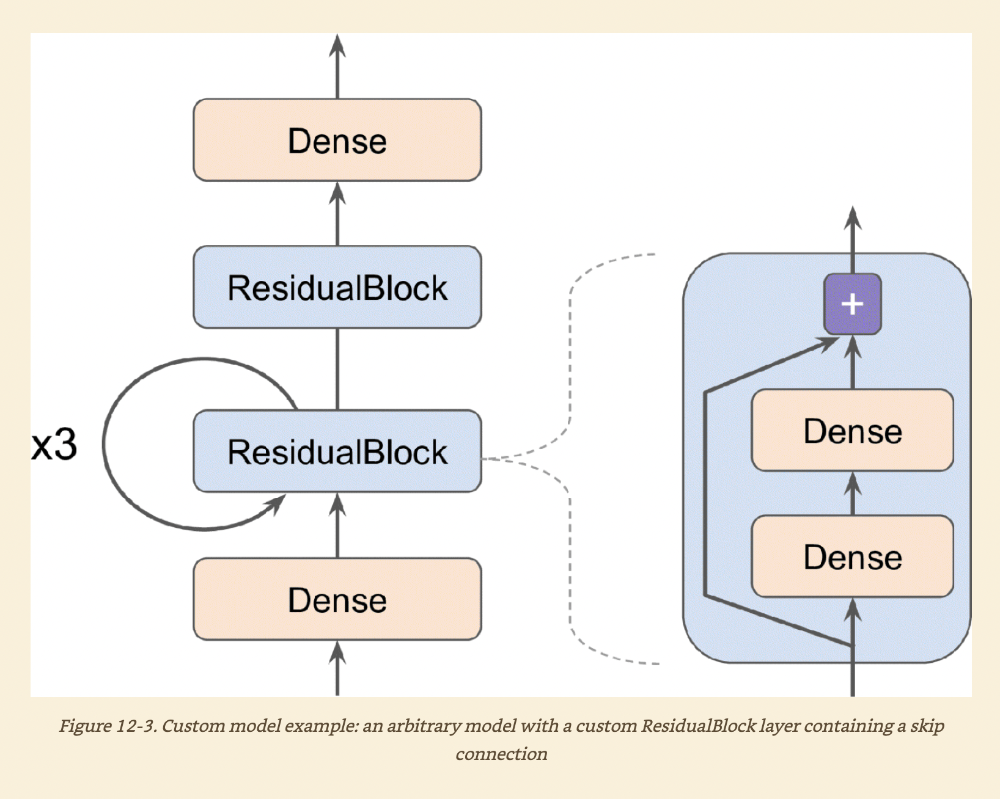
* **The inputs go through a first dense layer, then through a *residual block* composed of two dense layers and an addition operation, then through the same residual block three more times, then through a second residual block, and the final result goes through a dense output layer.**

**Creating a residual block layer.**

In [ ]:
class ResidualBlock(keras.layers.Layer):
    def __init__(self, n_layers, n_neurons, **kwargs):
        super().__init__(**kwargs)
        self.hidden = [keras.layers.Dense(n_neurons, activation="elu",
                                         kernel_initializer="he_normal") 
                      for _ in range(n_layers)]
    
    def call(self, inputs):
        Z = inputs
        for layer in self.hidden:
            Z = layer(Z)
        return inputs + Z

* **A residual block layer contains other layers.**
    * **This is handled transparently by keras: it automatically detets that the** hidden **attribute contains trackable objects(layers in this case), so their variables are automatically added to this layer's list of variables.**

In [ ]:
class ResidualRegressor(keras.Model):
    def __init__(self, output_dim, **kwargs):
        super().__init__(**kwargs)
        self.hidden1 = keras.layers.Dense(30, activation="elu",
                                         kernel_initializer="he_normal")
        self.block1 = ResidualBlock(2, 30)
        self.block2 = ResidualBlock(2, 30)
        self.out = keras.layers.Dense(output_dim)
        
    def call(self, inputs):
        Z = self.hidden1(inputs)
        for _ in range(1 + 3):
            Z = self.block1(Z)
        Z = self.block2(Z)
        return self.out(Z)

* **We create the layers in the constructor and use them in the** call( ) **method.This model can thne be used like any other model(compile it, fit evaluate it, and use it to make predictions).**
* **If you want to be able to save the model using the** save( ) **method and load it using the** keras.models.load_model( ) **function, you must implement the** get\_config( ) **method in both the** ResidualBlock **class and the** ResidualRegressor **class**
* **The** Model **class is a subclass of the** Layer **so models can be defined and used exactly like layers. But a model has some extra functionaliries, including** compile( ), fit( ), evaluate( ), **and** predict( ) **methods(and a few variants), plus the** get\_layers( ) **method(which can return any of the model's layers by name or by index) and the** save( ) **method(and support for** keras.models.load\_model( ) **and** keras.models.clone\_model( ))

### Losses and Metrics Based on Model Internals
* **To defie a custom loss based on model internals, compute it based on any part of the you want, then pass the result to the** add\_loss( ) **method.**

##### Example Building a Custom Regression MLP
* **Building a custom regression MLP moel composed of a stack of five hidden layers plus an output layer.**
* **This custom model will also have an auxiliary outout on top of the upper hidden layer.**
* **The loss associated to this auxiliary output will be called the *reconstruction loss*: it is the mean squared difference between the reconstruction and the inputs.**
    * **By adding this reconstruction loss to the main loss, we will encourage the model to preserve as much information as possible through the hidden layers - even information that is not directly useful for the regressio task itself.**

In [46]:
class ReconstructingRegressor(keras.Model):
    def __init__(self, output_dim, **kwargs):
        super().__init__(**kwargs)
        self.hidden = [keras.layers.Dense(30, activation="selu",
                                         kernel_initializer="lecun_normal")
                      for _ in rane(5)]
        self.out = keras.layers.Dense(output_dim)
        
    def build(self, batch_input_shape):
        n_inputs = batch_input_shape[-1]
        self.reconstruct = keras.layers.Dense(n_inputs)
        super().build(batch_input_shape)
        
    def call(self, inputs):
        Z = inputs
        for layer in self.hidden:
            Z = layer(Z)
        reconstruction = self.reconstruct(Z)
        recon_loss = tf.reduce_mean(tf.square(reconstruction - inputs))
        self.add_loss(0.05 * recon_loss)
        return self.out(Z)

* **The constrcutor created the DNN with five dense hidden layers and one dense output layer** 
* **The** build( ) **method creates an extra dense layer which will be used to reconstruct the inputs of the model. It must be created here because its number of units must be equal to the number of inputs, and this number is unknow before the** build( ) **method is called.**
* **The** call( ) **method processes the inputs through all five hidden layers, then passes the result through the reconstruction layer, which produces the reconstructions.**
* **Then the** call( ) **method computes the reconstructio loss(the mean squared differece between the reconstruction and the inputs), and adds it to the model's list of losses using the** add\_loss( ) **method.**
     **We scale down the reconstruction loss by multiplying it by** 0.05 **(this is a hyperparameter you can tune). Tis ensures that the reoconstruction loss does not dominate the main loss**
* **Finally, the** call( ) **method passes the output of the hidden layers to the output layer and returns its output.**

* **Similarly, you can add a custom metric based o model internals by computing it in any way you want, as long as the result if the output of a metric object.**

### Computing Gradients Using Autodiff


**Consider a simple toy function**

In [47]:
def f(w1, w2):
    return 3 * w1 ** 2  + 2 * w1 * w2

**TensorFlow's implementation of autodiff**

* **First we define two variables** w1 **and** w2.

In [48]:
w1, w2 = tf.Variable(5.), tf.Variable(3.)

* **Then we create a** tf.GradientTape **context that will automatically record every operation that involves a variable**

In [50]:
with tf.GradientTape() as tape:
    z = f(w1, w2)

* **Finally we ask this tape to compute the gradients of the result z with regard to both varables** \[w1, w2\]

In [51]:
gradients = tape.gradient(z, [w1, w2])

In [52]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>]

* **The** gradient( ) **method only goes through the recorded computations once(in reverse order), no matter how many variables here are, so it is incredibly efficient.**
* **The tape is automatically erased immediately after you call its** gradient( ) **method, so you will get an exception if you try to call** gradient( ) **twice**
* **If you need to call** gradient( ) **more than once, you must make the tape persistent and delete it each time you are done with it to free resources**

In [54]:
with tf.GradientTape(persistent=True) as tape:
    z = f(w1, w2)

dz_dw1 = tape.gradient(z, w1) # => tensor 36.0
dz_dw2 = tape.gradient(z, w2) # => tensor 10.0

In [55]:
dz_dw1

<tf.Tensor: shape=(), dtype=float32, numpy=36.0>

In [56]:
dz_dw2

<tf.Tensor: shape=(), dtype=float32, numpy=10.0>

In [57]:
del tape

**By default, the tape will only track operations invloving variables, so if you try to compute the gradient of z with regard to anything other than a variable, the result will be** None

In [58]:
c1, c2 = tf.constant(5.), tf.constant(3.)
with tf.GradientTape() as tape:
    z = f(c1, c2)
    
gradients = tape.gradient(z, [c1, c2]) # returns [None, None]

In [59]:
gradients

[None, None]

**You can force the tape to watch any tensors you like, to record every operation that involves them. You can then compute gradients with regard to these tensors, as if they were variables.**

In [60]:
with tf.GradientTape() as tape:
    tape.watch(c1)
    tape.watch(c2)
    z = f(c1, c2)

In [61]:
gradients = tape.gradient(z, [c1, c2]) # return [tensor 36., tensor 10.]

In [62]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=36.0>,
 <tf.Tensor: shape=(), dtype=float32, numpy=10.0>]

* **Most of the time a gradient tape is used to compute the gradients  of a single value(usually the loss) with regard to a set of values(usually the model parameters).**
* **This is wherer reverse-mode autodiff shines, as it just needs to do one forward pass and reverse pass to get all the gradients at once.**
* **If you try to compute the gradients of a vector, for example a vector containing multiple losses, the TensorFlow wil compute the gradients of the vector's sum.**
    * **If you ever need to get the individual gradients(e.g., the gradients of each loss with regard to the model parameters), you must call the tape's jacobian( ) method: it will perform reverse-mode autodiff once for each loss in the vector(all in paralell by default).**

* **In some cases you may want to stop gradients from backpropagating through some part of your neural network, to do this, you must use the** tf.stop\_gradient( ) **function**
    * **The function returns its inputs during the forward pass(like** tf.identity( )), **but it does not let gradients through during backpropgation.**

In [63]:
def f(w1, w2):
    return 3 * w1 ** 2 + tf.stop_gradient(2 * w1 * w2)

with tf.GradientTape() as tape:
    z = f(w1, w2) # same result as without stop_gradient()
    
gradients = tape.gradient(z, [w1, w2]) # => returns[tensor 30, None]

In [64]:
gradients

[<tf.Tensor: shape=(), dtype=float32, numpy=30.0>, None]

* **You may occasionally run into some numerical issues when computing gradients. For example, you you compute the gradients of the** my_softplus( ) **function for large inputs, the result will be** NaN

In [66]:
x = tf.Variable([100.])

In [67]:
with tf.GradientTape() as tape:
    z = my_softplus(x)

In [68]:
tape.gradient(z, [x])

[<tf.Tensor: shape=(1,), dtype=float32, numpy=array([nan], dtype=float32)>]

* **This is because computing the gradients of this function using autodiff leads to some numerical difficulties: due to floating-point precision errors, autodiff ends up computing infinity divided by infinity(which returns NaN)**
* **We can analytically find the derivative of the softplus function is just $ 1 / (1 + 1 / \exp(x)) $, which is numerically stable**
* **Next, we can tell TensorFlow to use the stable function when computing the gradients of the** my\_softplus( ) **function by decorating it with** @tf.custom_gradient **and making it return both its normal output and the function that computes the derivates.**

In [69]:
@tf.custom_gradient
def my_better_softplus(z):
    exp = tf.exp(z)
    def my_softplus_gradients(grad):
        return grad / (1 + 1 / exp)
    return tf.math.log(exp + 1), my_softplus_gradients

**Now when we compute the gradients of the** my\_better\_softplus( ) **function, we get the proper result, even for large input values.**

In [70]:
with tf.GradientTape() as tape:
    z = my_better_softplus(x)

In [71]:
gradient = tape.gradient(z, [x])

In [72]:
gradient

[<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>]

### Custom Training Loops
* **Unless you really need the extra flexibility, you should prefer using the** fit( ) **method rather than implementing you own training loop**

**First of all, let's build a simple model.**

In [73]:
l2_reg = keras.regularizers.l2(0.05)

In [74]:
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="elu",
                      kernel_initializer="he_normal",
                      kernel_regularizer=l2_reg),
    keras.layers.Dense(1, kernel_regularizer=l2_reg)
])

**Next, let's create a function that will radomly sample a batch of instances from the training set**

In [75]:
def random_batch(X, y, batch_size=32):
    idx = np.random.randint(len(X), size=batch_size)
    return X[idx], y[idx]

**Let's also define a function that will display the training status, including the number of steps, the totla number of steps, the mean loss since the start of the epoch(i.e., we will use the** Mean **metric to compute it), and other metrics:**

In [77]:
def print_status_bar(iteration, total, loss, metrics=None):
    metrics = " - ".join(["{}: {:.4f}".format(m.name, m.result())
                         for m in [loss] + (metrics or [])])
    end = "" if iteration < total else "\n"
    print("\r{}/{} - ".format(iteration, total) + metrics, end = end)

* {:.4f} **will format a float with four digits after the decimal point, and using** \r **(carriage return) along with** end="" **ensures that the status bar always gets printed on the same line**

**Define some hyperparameters and choose the optimizer, the loss function, and the metrics**

In [ ]:
n_epochs = 5
batch_size = 32
n_steps = len(X_train) // batch_size
optimizer = keras.optimizers.Nadam(lr=0.01)
loss_fn = keras.losses.mean_squared_error
mean_loss = keras.metrics.Mean()
metrics = [keras.metrics.MeanAbsoluteError()]

**Build a custom loop**

In [ ]:
for epoch in range(1, n_epochs + 1):
    print("Epoch {}/{}".format(epoch, n_epochs))
    for step in range(1, n_steps + 1):
        X_batch, y_batch = random_batch(X_train_scaled, y_train)
        with tf.GradientTape() as tape:
            y_pred = model(X_batch, training=True)
            main_loss = tf.reduce_mean(loss_fn(y_batch, y_pred))
            loss = tf.add_n([main_loss] + model.losses)
        gradients = tape.gradient(loss, 
                                  model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, 
                                      model.trainable_variables))
        mean_loss(loss)
        for metric in metrics:
            metric(y_batch, y_pred)
        print_status_bar(step * batch_size, len(y_train),
                        mean_loss, metrics)
        print_status_bar(len(y_train), len(y_train), mean_loss, 
                        metrics)
        for metric in [mean_loss] + metrics:
            metric.reset_states()

* **We create two nested loops: one for the epoch, the other for the batches within an epoch.**
* **Then we sample a random batch from the training set.**
* **Inside the** tf.GradientTape( ) **block, we make a prediction for one batch(using the model as a function), and we compute the loss: it is equal to the main loss plus the other losses(in this model, there is one regularization loss per layer)**
    * **Since the** mean\_squres\_error( ) **function returns one loss per instance, we compute the mean over the bathc using** tf.reduce\_mean( ) 
    * **The regularization losses are already reduced to a single scalar, so we just need to sum them.**
* **Next, we ask the tape to compute the gradient of the loss with regard to each trainable variable(not all variables!), and we apply them to the optimizer to perform a Gradient Descent step.**
* **Then we update the mean loss and the metrics(over the current epoch), and we display the status bar).**
* **At the end of each epoch, we display the status bar again to make it look complete and to print a line feed, and we reset the state of the mean loss and metrics.**

* **If you want to apply Gradient Clipping, just set the optimizer's** clipnorm **or** clipvalue **hyperparameter**
* **If you want to apply any other transformation to the gradients, simply do so before calling the** apply\_gradients( ) **method**
* **if you add weight constraints to you model, you should update the training loop to apply these constraints just after** apply\_gradients( )

In [ ]:
for variable in model.variables:
    if variable.constraint is not None:
        variable.assign(variable.constraint(variable))

* **Most importantly, this traiing loop does not handle layers that hehave differently during training and testng(e.g,** BatchNormalization **or** Dropout **). TO handle these, you need to call the model with** training=Tru **and make sure it propagates this every layer that needs it.**

## TensorFlow Functions and Graphs

**Let's define a trivial function**

In [81]:
def cube(x):
    return x ** 3

**Call the function with a Python value**

In [82]:
cube(2)

8

**Call the function with a tensor**

In [83]:
cube(tf.constant(2.0))

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

**We can use** tf.function( ) **to convert a Python function to a** *TensorFlow **function.**

In [84]:
tf_cube = tf.function(cube)

In [85]:
tf_cube

**The TF funcrion can then be used exactly like the original Python function, and it will return the same result as tensors**

In [86]:
tf_cube(2)

<tf.Tensor: shape=(), dtype=int32, numpy=8>

In [87]:
tf_cube(tf.constant(2.0))

<tf.Tensor: shape=(), dtype=float32, numpy=8.0>

* **Under the hood,** tf.function( ) **analyzed the computations performed by the** cube( ) **function and generated an equivalent computation graph.**
* **Alternatively you could have used** tf.function **as a decorator**

In [88]:
@tf.function
def tf_cube(x):
    return x ** 3

**The original Python function is still availiale via the TF Function's** python_function **attribute, in case you ever need it.**

In [89]:
tf_cube.python_function(2)

8

* **TensorFlow optimizes the computation graph, pruning unused nodes, simplifying expressions and more.**
* **Once the optimized graph is ready, the TF Function effciently exexutes the operations in the graph, in the appropriate order(ad in parallel when it can). As a result, a TF Function will usually run much faster than the original Puthon function, especially if it performs complex computations.**
* **When you write a custom loss function, a custom metric, a custom layer, or any other custom function and you use it in a Keras model, Keras automatically converts your function into a TF function.**
    * **You can tell Keras *not* to convert your Pyton functions to TF Functions by setting** dynamic=True **when creating a custom layer or a custom model. Or you can set** run\_eagerly=True **when calling the model's** compile( ) **method.**
* **By default, a TF function generates a new graph for ebery unique set of input shapes and data types and cahces it for subsequent calss.**
    * **This is only true for tensor arguments: if you pass numerical Python values to a TF Function, a new graph will be generated for every distinct value.**

### AutoGraph and Tracing
##### Autograph
* **TensorFlow analyzes the Python function's source code to capture all the control flow statements, such as for loops, while loops, and if statements, as well as break, continue, and return statements.**
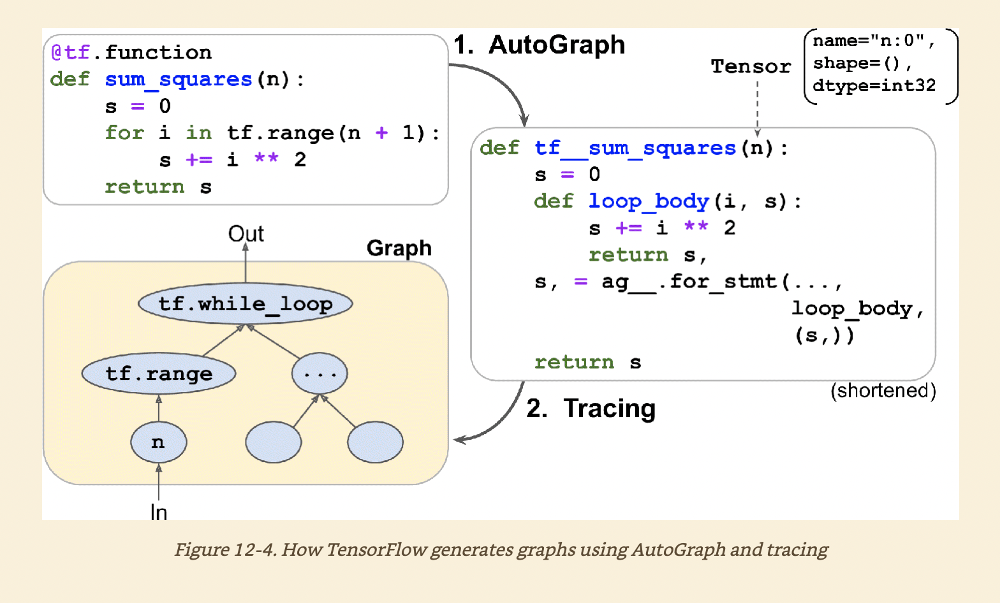

* **AutoGraph analyzes the source code of the** sum\_squares( ) **Python functiin, and it generates the** tf\_sum\_squares( ) **function.**
    * **In this functin, the** for **loop is replaced by the definition of the** loop\_body( ) **function(containing the body of the original** for **loop), followed by a call to the** for\_stmt( ) **function. THis call will build the appropriate** tf.while_loop( ) **operation in the computation graph.**
    
##### Tracing
* **TensorFlow calls this upgraded function, but instead of passing the argument, it passes a symbolic tensor - a tensor without any actual value, only a name, a data type, and a shape.**
    * **the function will run in a *graph modde*, meaning that each TensorFlow oeation will add a node in the grah to represent itself and its output tensors.**
    * **In graph mode, TF operations do not perform any computations.**